In [63]:
import pandas as pd
import matplotlib.pyplot as plt
from cartopy.io.img_tiles import GoogleTiles
from cartopy.mpl.geoaxes import GeoAxes
from matplotlib.markers import MarkerStyle

from bq.queries import run_query
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [42]:
# GDelt project
events = pd.DataFrame(
	run_query(
		"""
		select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events`
		where ActionGeo_Lat is not null and ActionGeo_Long is not null
		order by SQLDATE asc
		limit 1000000
		""",
		debug=True
	)
)

Running query: select ActionGeo_Lat, ActionGeo_Long, SQLDATE from `gdelt-bq.gdeltv2.events` where ActionGeo_Lat is not null and ActionGeo_Long is not null order by SQLDATE asc limit 1000000
Query complete, fetching data.
Downloading: 100%|██████████|
Fetched 1000000 rows.


In [39]:
events.head()

,ActionGeo_Lat,ActionGeo_Long
0,39.9289,116.38800
1,49.0000,32.00000
2,-18.1333,178.41700
3,41.9000,12.48330
4,41.3833,2.18333


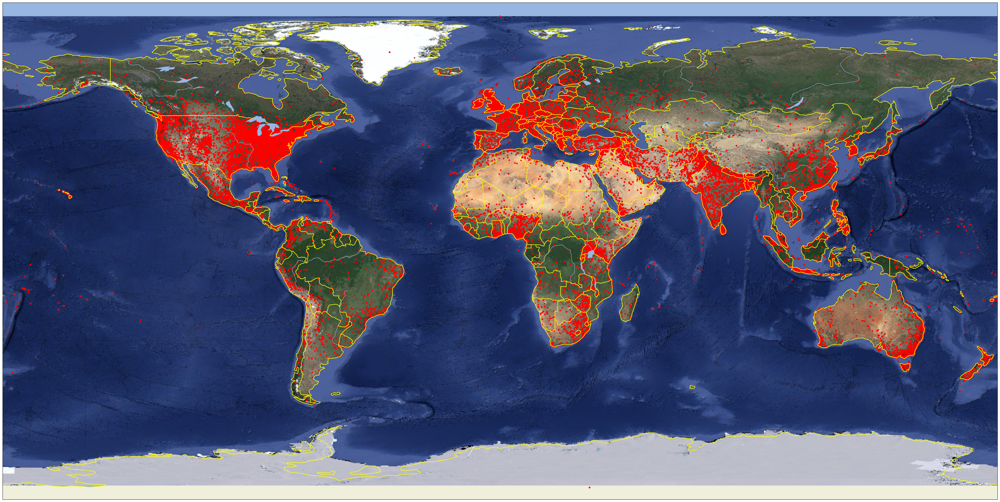

In [70]:
# plot a map of the events
fig = plt.figure(figsize=(50, 30))
ax: GeoAxes = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.set_extent([-180, 180, -90, 90], crs=ccrs.PlateCarree())
ax.coastlines(linestyle='-', color='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.BORDERS, linestyle='-', edgecolor='yellow', linewidth=1.5)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
tiler = GoogleTiles(style="satellite", cache=True)
ax.add_image(tiler, 4)

ax.scatter(
	events['ActionGeo_Long'],
	events['ActionGeo_Lat'],
	transform=ccrs.PlateCarree(),
	color='red',
	marker='.',
)

plt.show()